# Import Library & Set Globals

In [3]:
%load_ext jupyter_black

# base
import os
import sys
import warnings
import logging
import pickle

# data manipulation
import pickle
import pandas as pd
import itables
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# single cell
import scanpy as sc
import decoupler as dc
import gseapy as gp

itables.init_notebook_mode(connected=True)  # Use connected=False for offline use
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", pd.errors.DtypeWarning)
warnings.simplefilter("ignore", pd.errors.PerformanceWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

# custom
from single_cell.R import *
from single_cell.preprocess import *
from single_cell.plot import *
from single_cell.analysis import *
from spatial_seq.plot import *
from utils import *

converter = get_converter()

# R_preload()
%load_ext rpy2.ipython

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [4]:
%matplotlib inline
study = "paper_processed_FULL"
R_converted = False

CORES = 10
DATADIR = "../../../data"
REFDIR = "../../../references"
DOUBLETMETHODS = ["scDblFinder", "DoubletFinder", "doubletdetection", "scrublet"]

# Get all data

In [162]:
# load
annotation = "manDoublet-seuratV3-harmony-annotated"
savedir = os.path.join(DATADIR, "processed", "single cell", "3_annotated")
adata = sc.read_h5ad(os.path.join(savedir, f"{annotation}.h5ad"))

# order categories
order_obs(
    adata,
    "Identifier",
    [
        "GSM7747185-LFD_eWAT",
        "GSM7747187-HFD_eWAT",
        "GSM7747186-LFD_iWAT",
        "GSM7747188-HFD_iWAT",
    ],
)
order_obs(
    adata,
    "Groups",
    [
        "GSM7747185-LFD_eWAT",
        "GSM7747187-HFD_eWAT",
        "GSM7747186-LFD_iWAT",
        "GSM7747188-HFD_iWAT",
    ],
)
order_obs(adata, "Experiment", ["GSM7747185", "GSM7747186", "GSM7747187", "GSM7747188"])
order_obs(adata, "Condition", ["LFD", "HFD"])
order_obs(adata, "Sample Type", ["eWAT", "iWAT"])

In [163]:
# # save
# annotation = "manDoublet-seuratV3-harmony-annotated"
# savedir = os.path.join(DATADIR,'processed',study,'py', '3_annotated')
# adata.write(os.path.join(savedir,f'{annotation}.h5ad'))

# Adipocyte prep

### Create Subset

Index(['Adipocyte', 'Fibroblast', 'Mesothelial', 'Endothelial', 'PC/SMC',
       'Macrophage', 'Dendritic Cell', 'Mast Cell', 'T Cell', 'B Cell'],
      dtype='object')
Starting UMAP...
Starting LocalMAP...


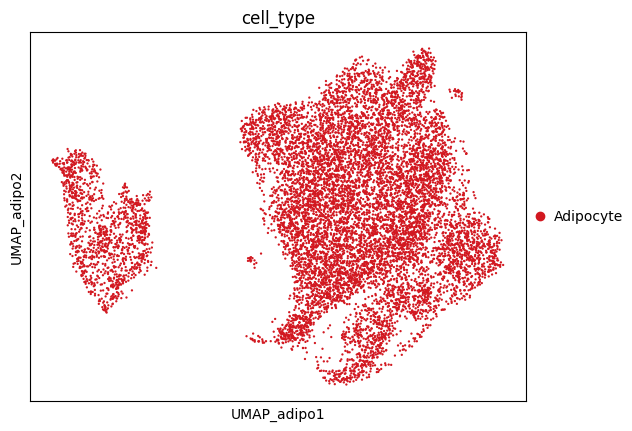

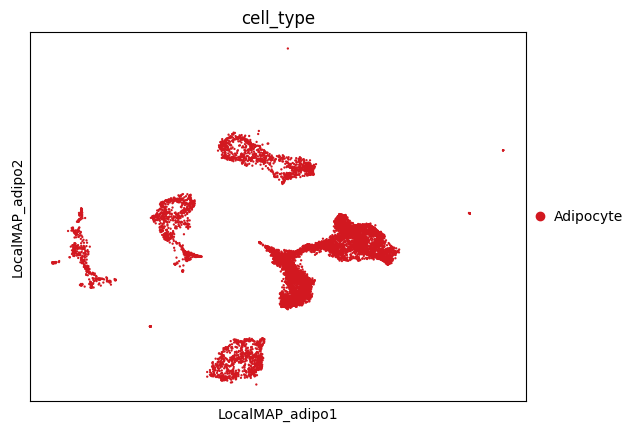

In [179]:
# subset
print(adata.obs["cell_type"].cat.categories)
adata_adipo = adata[adata.obs["cell_type"].isin(["Adipocyte"])].copy()
del adata_adipo.uns, adata_adipo.varm, adata_adipo.obsp
sc.pp.filter_cells(adata_adipo, min_genes=200)
sc.pp.filter_genes(adata_adipo, min_cells=5)
Visualize(adata_adipo, "_adipo")
sc.pl.embedding(
    adata_adipo,
    basis="UMAP_adipo",
    color="cell_type",
    palette=color_gen(adata_adipo.obs["cell_type"]).to_list(),
)
sc.pl.embedding(
    adata_adipo,
    basis="LocalMAP_adipo",
    color="cell_type",
    palette=color_gen(adata_adipo.obs["cell_type"]).to_list(),
)

Category Groups has 4 groups!


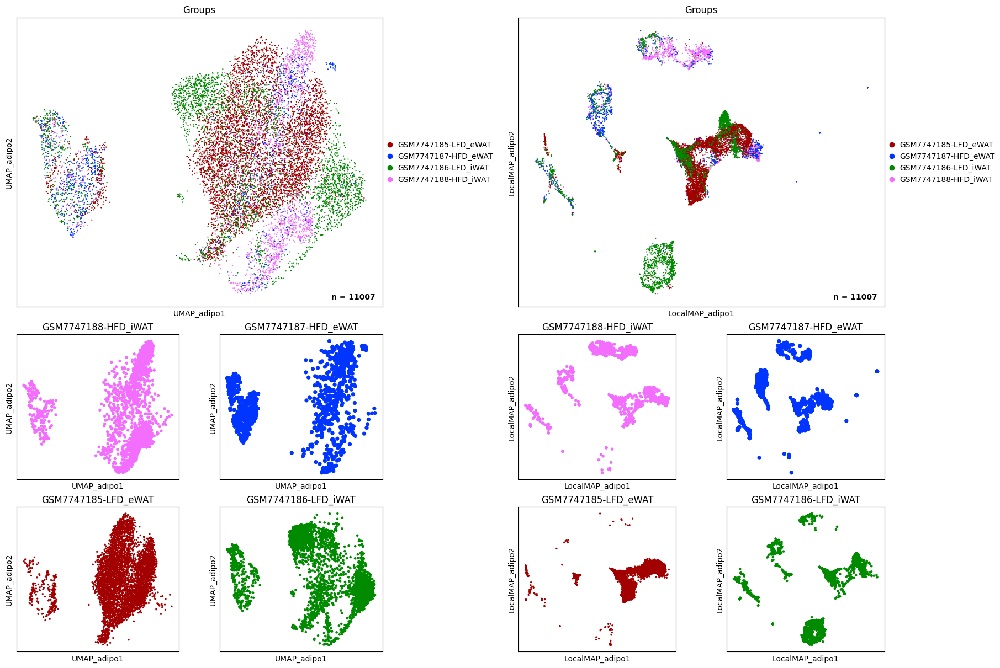

In [47]:
# integration check
f = plt.figure(figsize=(18, 12), layout="constrained")
check_integration(
    adata_adipo,
    "Groups",
    f,
    embeddings=["UMAP_adipo", "LocalMAP_adipo"],
    nrow=2,
    ncol=2,
)

### Clusters

  0%|          | 0/6 [00:00<?, ?it/s]

100%|██████████| 6/6 [01:06<00:00, 11.05s/it]


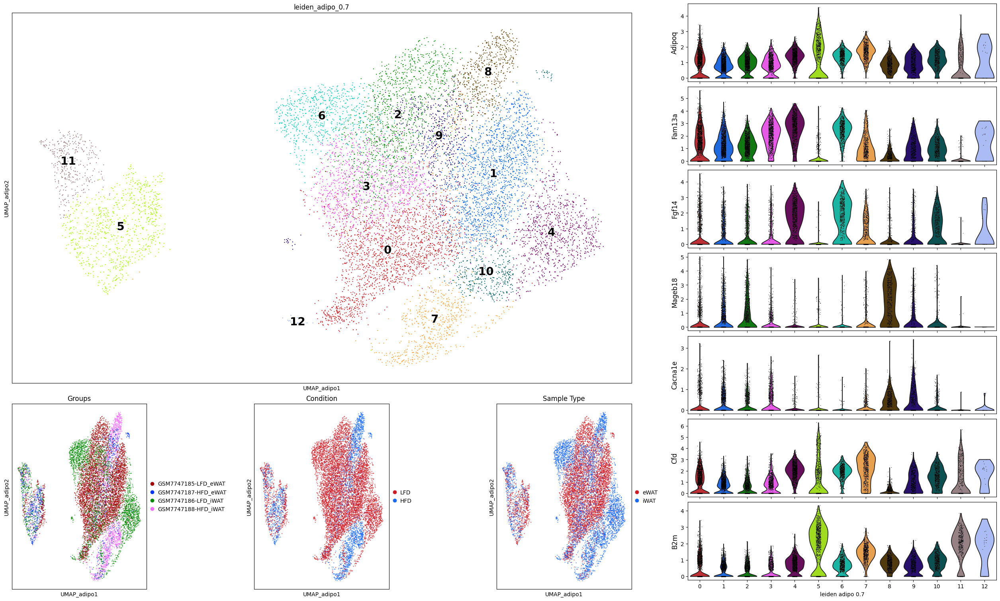

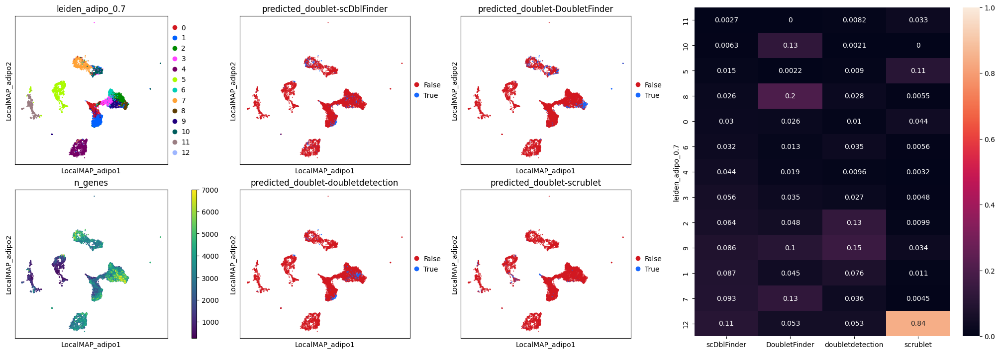

In [180]:
recluster = True
key = "leiden_adipo"
res = 0.7
res_key = f"{key}_{res:.1f}"
embedding = "UMAP_adipo"  # "LocalMAP_adipo"

if recluster is True:
    Cluster(adata_adipo, key, np.arange(5, 10 + 1) / 10)

# figure prep
cluster_c = color_gen(adata_adipo.obs[res_key]).to_list()
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=res_key,
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c,
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Groups"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Groups"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = ["Adipoq", "Fam13a", "Fgf14", "Mageb18", "Cacna1e", "Cfd", "B2m"]
plot_violinplot(adata_adipo, markers, res_key, sf[1])
checkDoublets(adata_adipo, "LocalMAP_adipo", res_key)

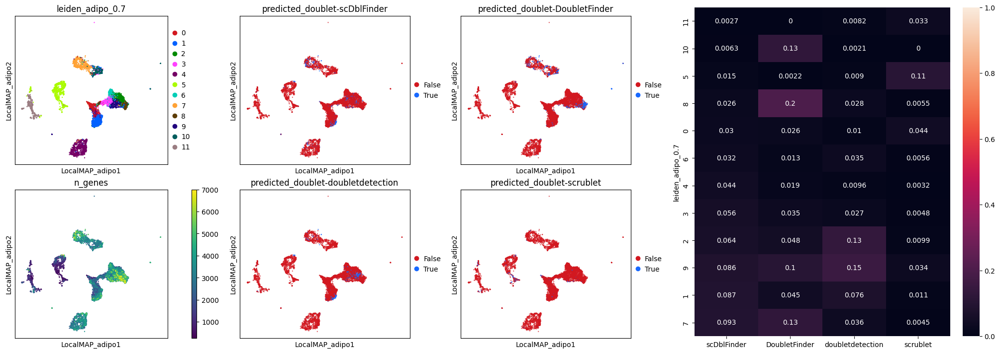

In [181]:
# remove group 12
adata_adipo = adata_adipo[adata_adipo.obs[res_key] != "12"]
checkDoublets(adata_adipo, "LocalMAP_adipo", res_key)

<Axes: xlabel='leiden_adipo_0.7'>

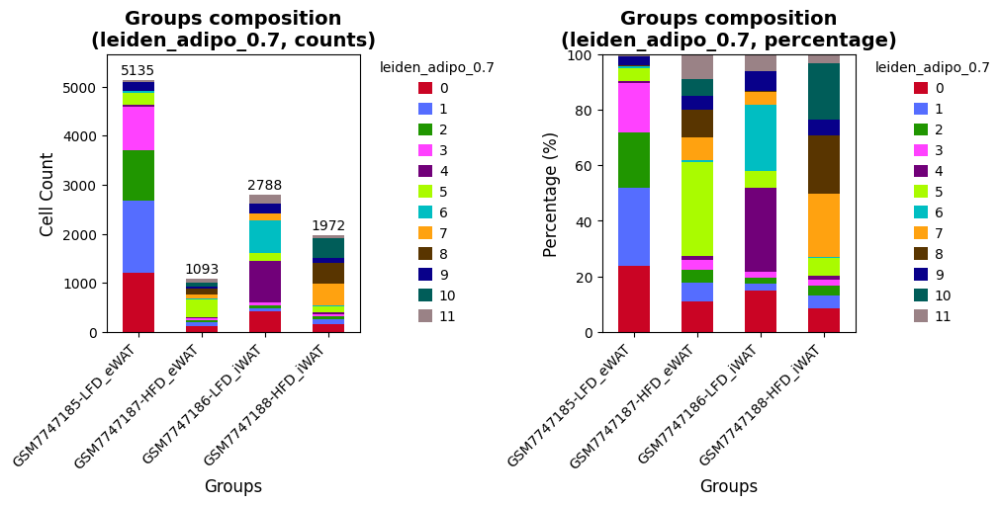

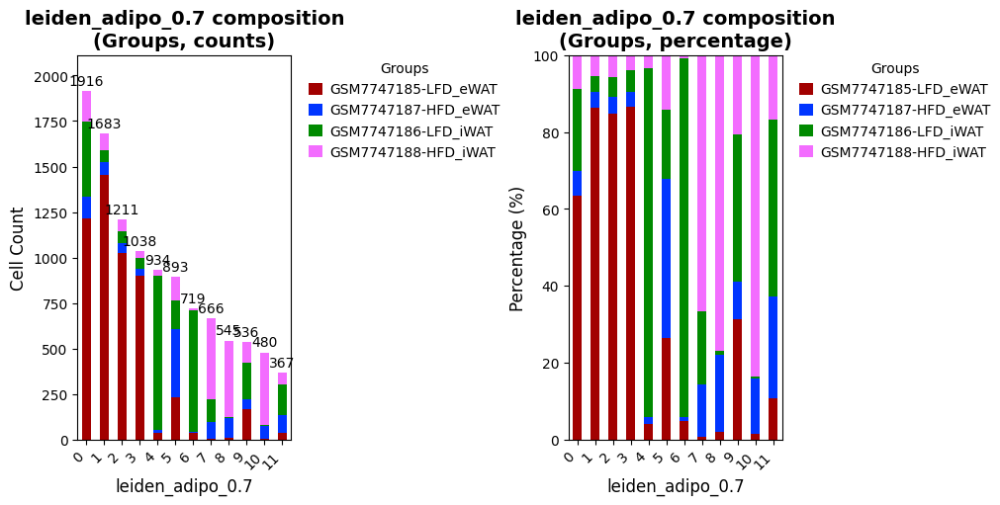

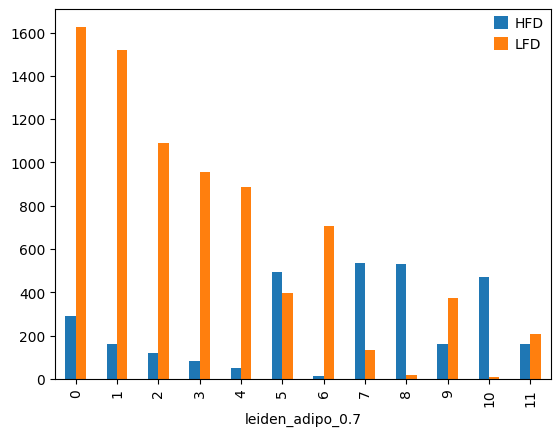

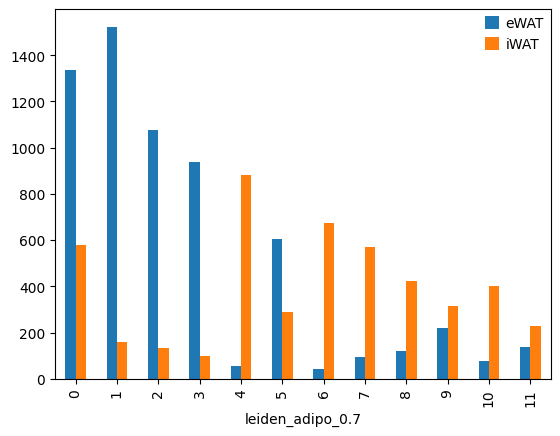

In [167]:
# cluster composition
cluster_key = "leiden_adipo_0.7"
group_key = "Groups"

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_adipo, group_key, cluster_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_adipo, group_key, cluster_key, pct=True, ax=axs[1])

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_adipo, cluster_key, group_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_adipo, cluster_key, group_key, pct=True, ax=axs[1])

tb_count = pd.crosstab(adata_adipo.obs[cluster_key], adata_adipo.obs[group_key]).T
tb_count["Condition"] = ["LFD", "HFD", "LFD", "HFD"]
tb_count["Tissue"] = ["eWAT", "eWAT", "iWAT", "iWAT"]
tmp = {}
for a, df in tb_count.groupby("Condition"):
    tmp[a] = df.sum()[:-2]
pd.DataFrame(tmp).plot.bar()

tmp = {}
for a, df in tb_count.groupby("Tissue"):
    tmp[a] = df.sum()[:-2]
pd.DataFrame(tmp).plot.bar()

In [168]:
ewat_adipo = adata_adipo[adata_adipo.obs["Sample Type"] == "eWAT"]
iwat_adipo = adata_adipo[adata_adipo.obs["Sample Type"] == "iWAT"]

### Characterize Clusters

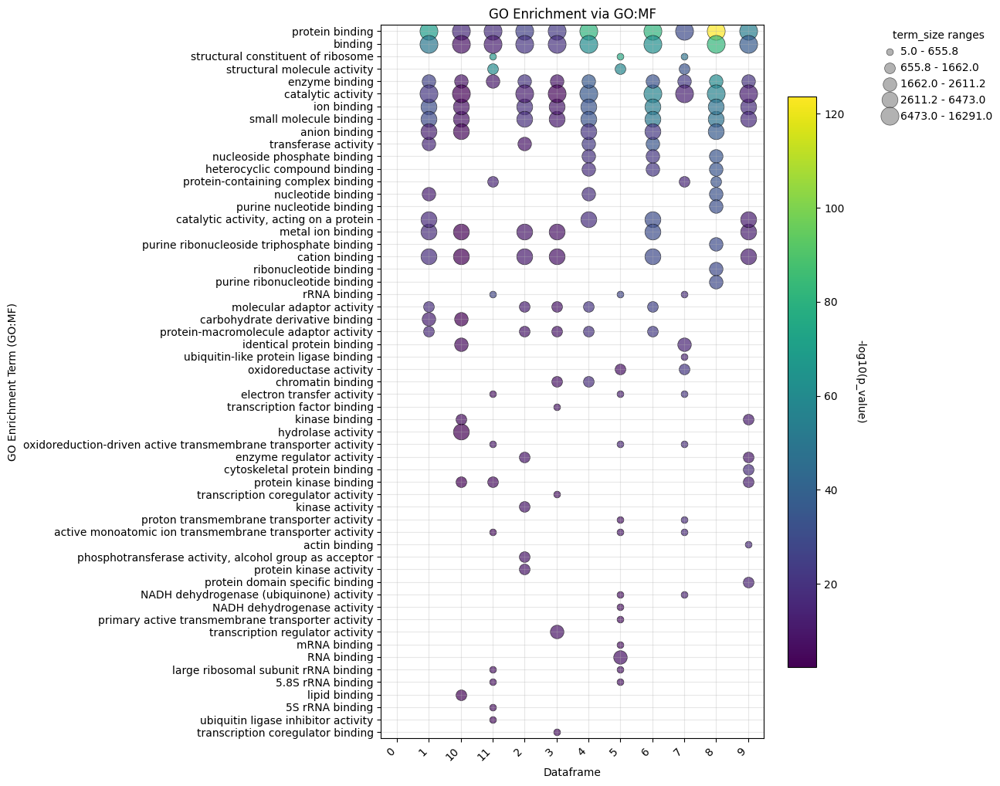

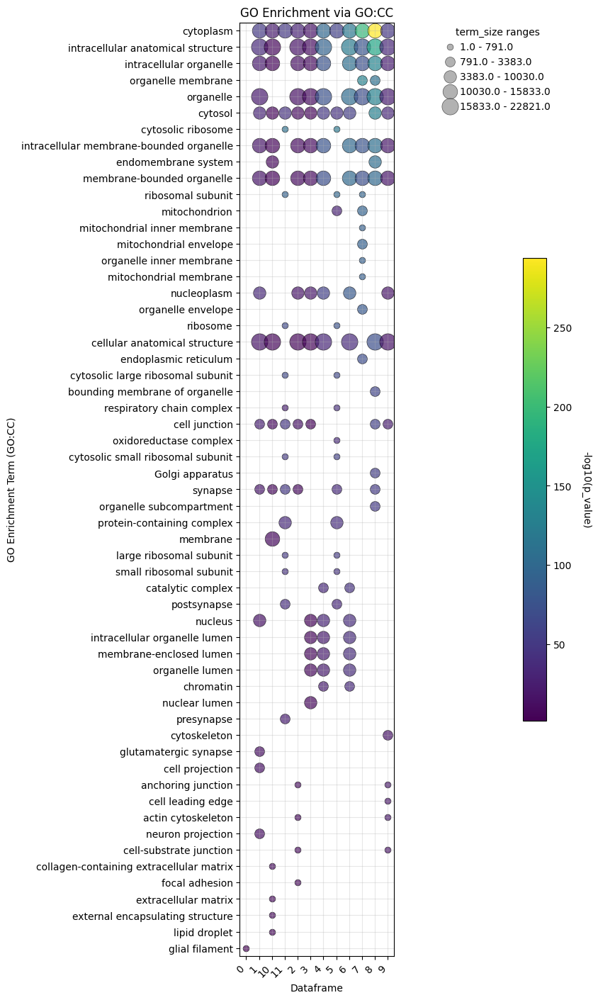

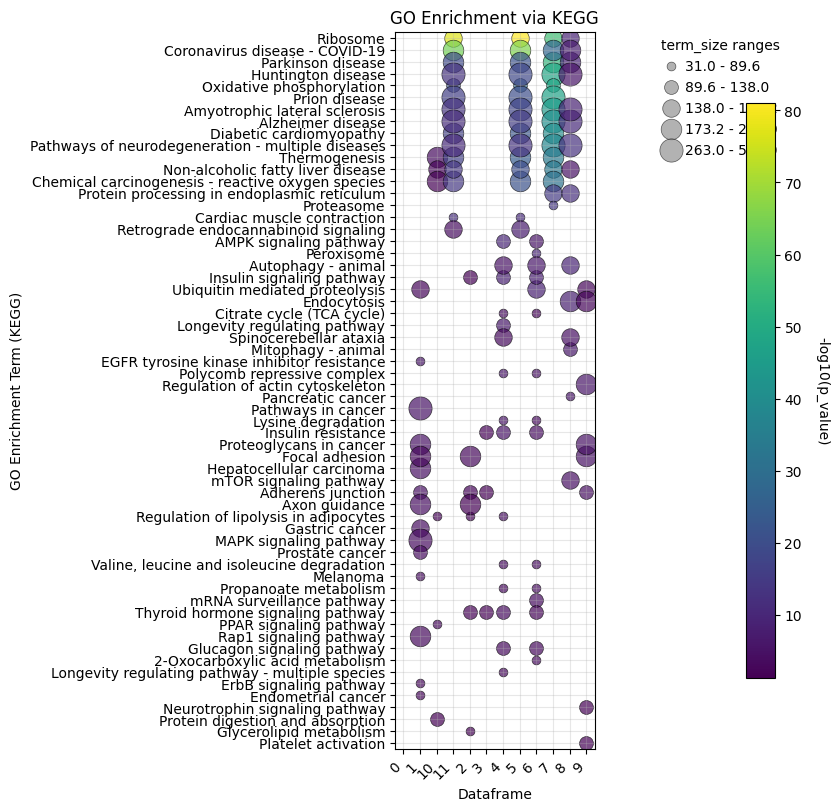

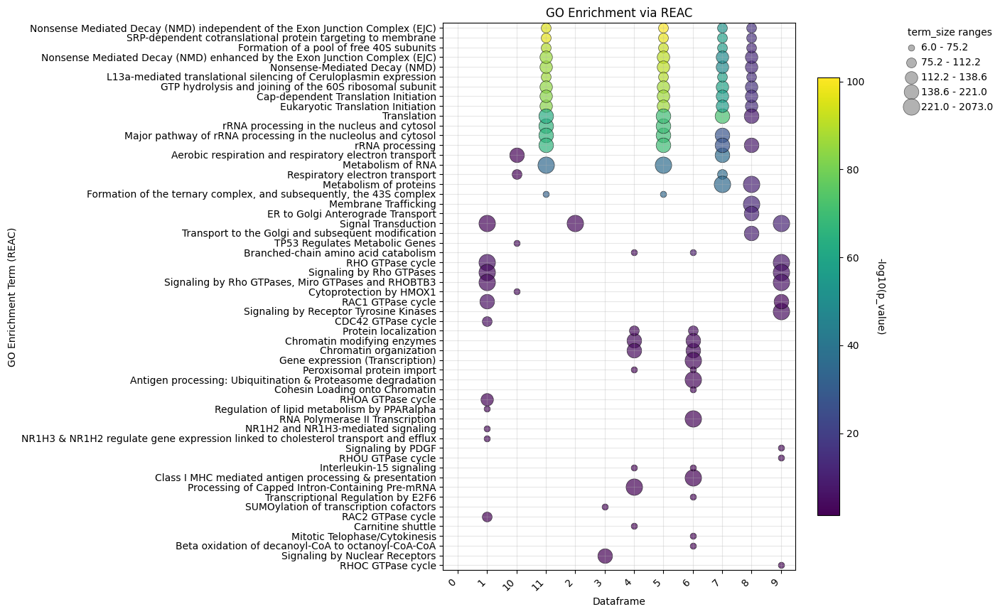

In [127]:
sources = ["GO:MF", "GO:CC", "KEGG", "REAC"]
res_key = "leiden_adipo_0.7"
de_key = "de_adipo_sub"

GOterms = GO_Enrich(
    ewat_adipo,
    res_key,
    de_key,
    sources=sources,
    pval_cutoff=1e-10,
    log2fc_min=0,
)

figsizes = [(8, 12), (8, 14), (8, 8), (8, 10)]
for n, source in enumerate(sources):
    fig = plot_go_enrichment(
        df_dict=GOterms[source],
        pvalue_col="p_value",
        score_col="term_size",
        pvalue_threshold=0.05,
        rank_by="pvalue",
        top_n=15,
        use_log_pvalue=True,
        use_log_score=False,
        figsize=figsizes[n],
        database=source,
    )

    plt.show()

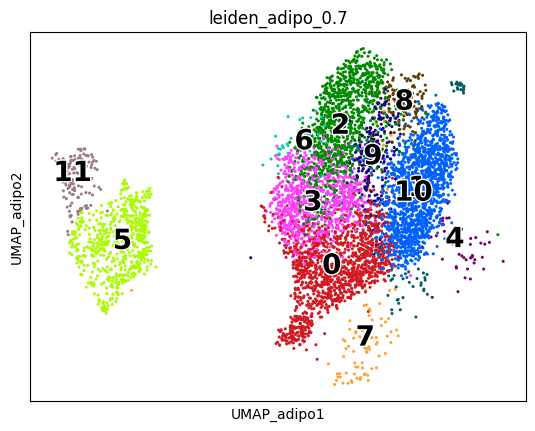

In [ ]:
sc.pl.embedding(
    ewat_adipo,
    basis="UMAP_adipo",
    color=res_key,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c,
)

dendrogram data not found (using key=dendrogram_leiden_adipo_0.7). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.


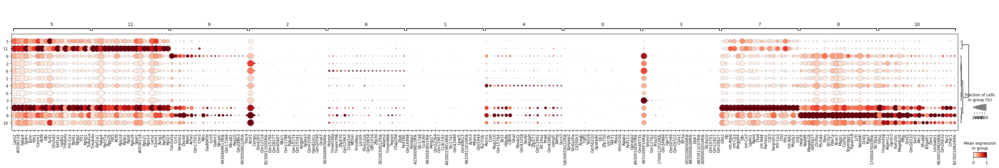

Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


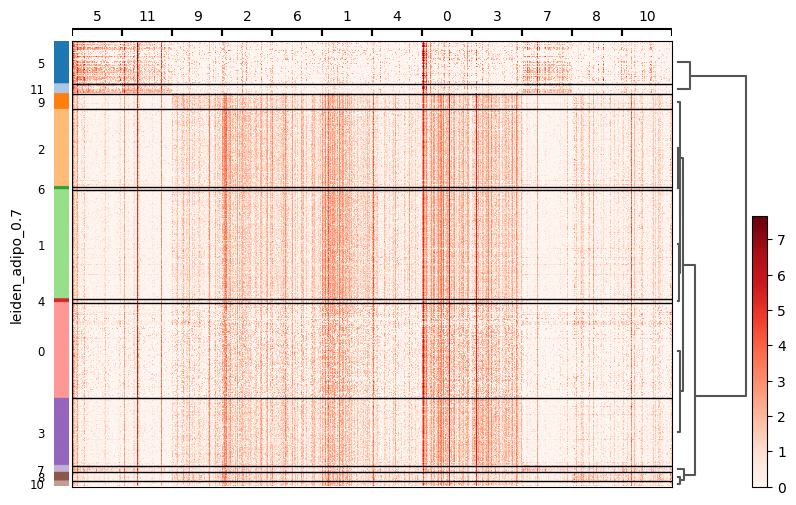

In [124]:
# original subclusters
key = "leiden_adipo"
res = 0.7
res_key = f"{key}_{res:.1f}"
de_key = "de_adipo_sub"
run_DEGs = True

clear_uns(ewat_adipo, res_key)
if run_DEGs is True:
    sc.tl.rank_genes_groups(
        ewat_adipo,
        groupby=res_key,
        key_added=de_key,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    ewat_adipo,
    groupby=res_key,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
)
sc.pl.rank_genes_groups_heatmap(
    ewat_adipo,
    key=de_key,
    groupby=[res_key],
    layer="normalized",
    n_genes=50,
    cmap="Reds",
)

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2


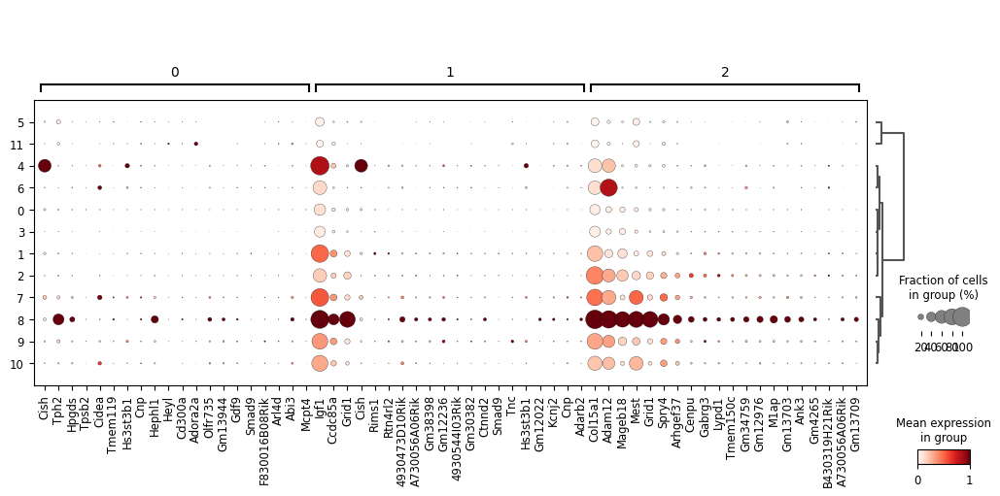

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2
Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


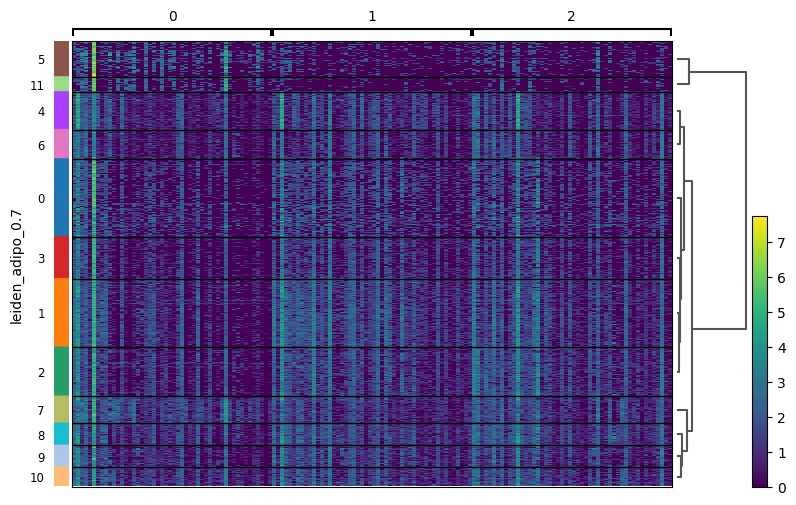

In [133]:
ref = "3"
de_key = "de_0-3"
subgroup_list = pd.Series([0, 1, 2]).astype(str).to_list()

sc.tl.rank_genes_groups(
    adata_adipo,
    groups=subgroup_list,
    reference=ref,
    groupby=cluster_key,
    key_added=de_key,
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)

f, ax = plt.subplots(1, 1, figsize=(10, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_adipo,
    groups=subgroup_list,
    key=de_key,
    groupby=cluster_key,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
)
sc.pl.rank_genes_groups_heatmap(
    adata_adipo,
    groups=subgroup_list,
    key=de_key,
    groupby=cluster_key,
    layer="normalized",
    n_genes=50,
)

In [ ]:
# https://www-cell-com.ucsf.idm.oclc.org/cell-metabolism/fulltext/S1550-4131(23)00038-4
paper_markers = [
    "Acaca",
    "Acly",
    "Fasn",
    "Dgat1",
    "Dgat2",
    "Car3",
    "Apoe",
    "Cd36",
    "Hif1a",
    "Ddr2",
    "Ebf2",
    "Pck1",
    "Cacna1a",
    "Cacna1e",
    "Fgf1",
    "Mt2",
    "Bcl3",
]

key = "leiden_adipo"
res = 0.7
res_key = f"{key}_{res:.1f}"

sc.pl.embedding(
    ewat_adipo, "UMAP_adipo", color=paper_markers, layer="normalized", cmap="Reds"
)
f = plt.figure(layout="constrained", figsize=(10, 20))
plot_violinplot(ewat_adipo, paper_markers, res_key, f)

f = plt.figure(layout="constrained", figsize=(20, 30))
plot_cluster_violinplot(ewat_adipo, "Condition", res_key, paper_markers, f)

# Cluster Regrouping

Loading ITables v2.4.4 from the internet... (need help?)


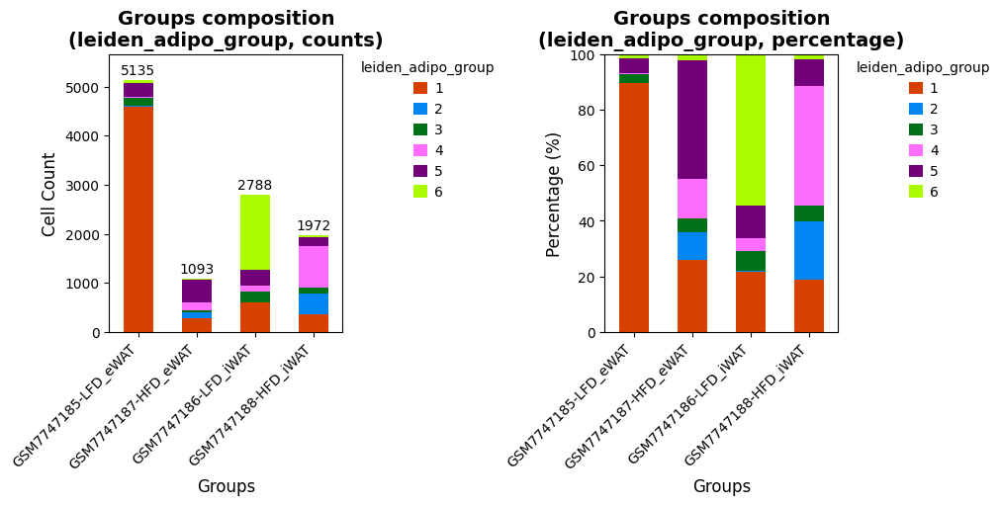

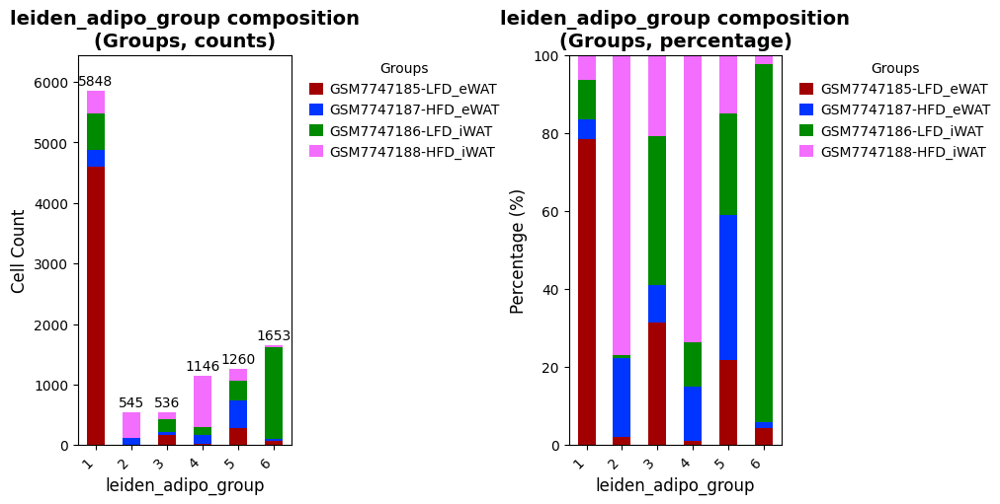

In [ ]:
old_cluster_key = "leiden_adipo_0.7"
cluster_key = "leiden_adipo_group"
group_key = "Groups"

adata_adipo.obs[cluster_key] = (
    adata_adipo.obs[old_cluster_key]
    .map(
        {
            "0": 1,
            "1": 1,
            "2": 1,
            "3": 1,
            "4": 6,
            "6": 6,
            "8": 2,
            "9": 3,
            "7": 4,
            "10": 4,
            "5": 5,
            "11": 5,
        }
    )
    .astype(str)
)

# reannotate
order_obs(
    adata_adipo,
    cluster_key,
    pd.Series(np.sort(adata_adipo.obs[cluster_key].unique())).astype(str),
)

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_adipo, group_key, cluster_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_adipo, group_key, cluster_key, pct=True, ax=axs[1])

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_adipo, cluster_key, group_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_adipo, cluster_key, group_key, pct=True, ax=axs[1])

pd.crosstab(adata_adipo.obs[cluster_key], adata_adipo.obs[group_key])

dendrogram data not found (using key=dendrogram_leiden_adipo_group). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.


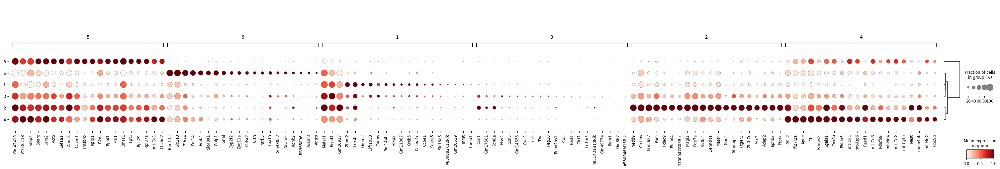

Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


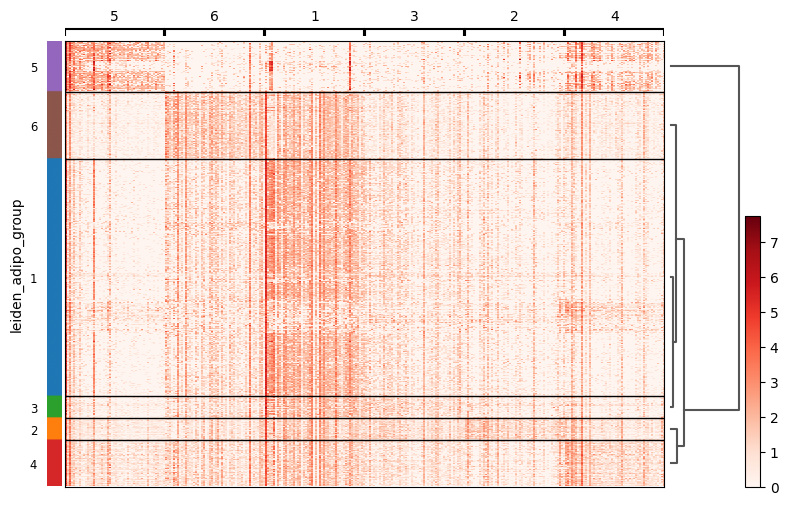

In [187]:
group_key = "leiden_adipo_group"
de_key = "de_adipo"

# clean metadata
clear_uns(adata_adipo, group_key)

# run DEGs
sc.tl.rank_genes_groups(
    adata_adipo,
    groupby=group_key,
    key_added=de_key,
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)

# plot DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_adipo,
    groupby=group_key,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
)

# plot DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_adipo,
    key=de_key,
    groupby=group_key,
    layer="normalized",
    n_genes=50,
    cmap="Reds",
)

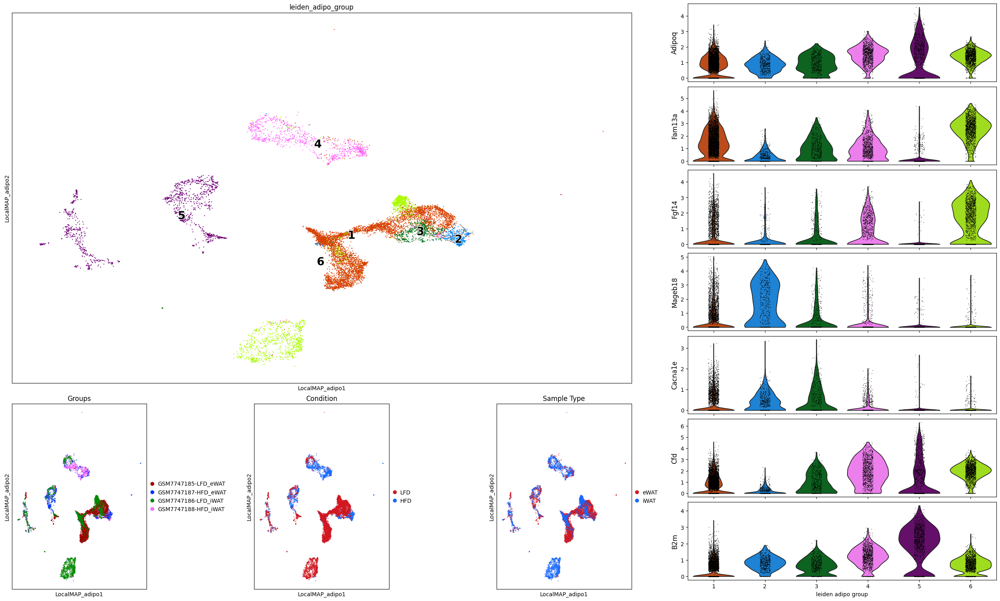

In [188]:
# figure prep
key = "leiden_adipo_group"
embedding = "LocalMAP_adipo"  # "UMAP_adipo"

# figure prep
cluster_c = color_gen(adata_adipo.obs[key])
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=[key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c.to_list(),
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Groups"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Groups"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = ["Adipoq", "Fam13a", "Fgf14", "Mageb18", "Cacna1e", "Cfd", "B2m"]
plot_violinplot(adata_adipo, markers, key, sf[1])

In [191]:
# relevant subsets
ewat_adipo = adata_adipo[adata_adipo.obs["Sample Type"] == "eWAT"].copy()
lfd_ewat_adipo = ewat_adipo[ewat_adipo.obs["Condition"] == "LFD"].copy()
hfd_ewat_adipo = ewat_adipo[ewat_adipo.obs["Condition"] == "HFD"].copy()

# Dissecting clusters

In [ ]:
# define markers
selected_markers = ["Xbp1", "Ern1", "Ddit3", "Hspa5", "Tnf", "Il6"]
diff_markers = ["Cebpb", "Zfp423", "Pparg", "Cd36"]

tgfb_genes = [
    "Il33",
    "Ly6a",
    "Ccl2",
    "Dpp4",  # No response
    "Smad2",
    "Smad3",
    "Smad4",
    "Serpine1",
    "Id1",
    "Id2",
    "Id3",  # Intermediate responsive
    "Fn1",
    "Postn",
    "Cthrc1",
    "Vim",
    "Col1a1",
    "Col1a2",
    "Serpinh1",  # High responsive
]

ifn_genes = [
    "Fasn",
    "Irs1",
    "Insr",  # Repressed
    "Irf3",
    "Irf4",
    "Ifi47",
    "Irf1",
    "Ifitm1",
    "Ifitm2",
    "Ifitm3",  # Induced
]

cytokine_markers = pd.Series(tgfb_genes + ifn_genes).unique().tolist()

all_adipo_markers = pd.Series(selected_markers + diff_markers).unique().tolist()

Text(0.5, 0.98, 'HFD vs LFD expression by cluster (eWAT Adipo)\nSelected markers')

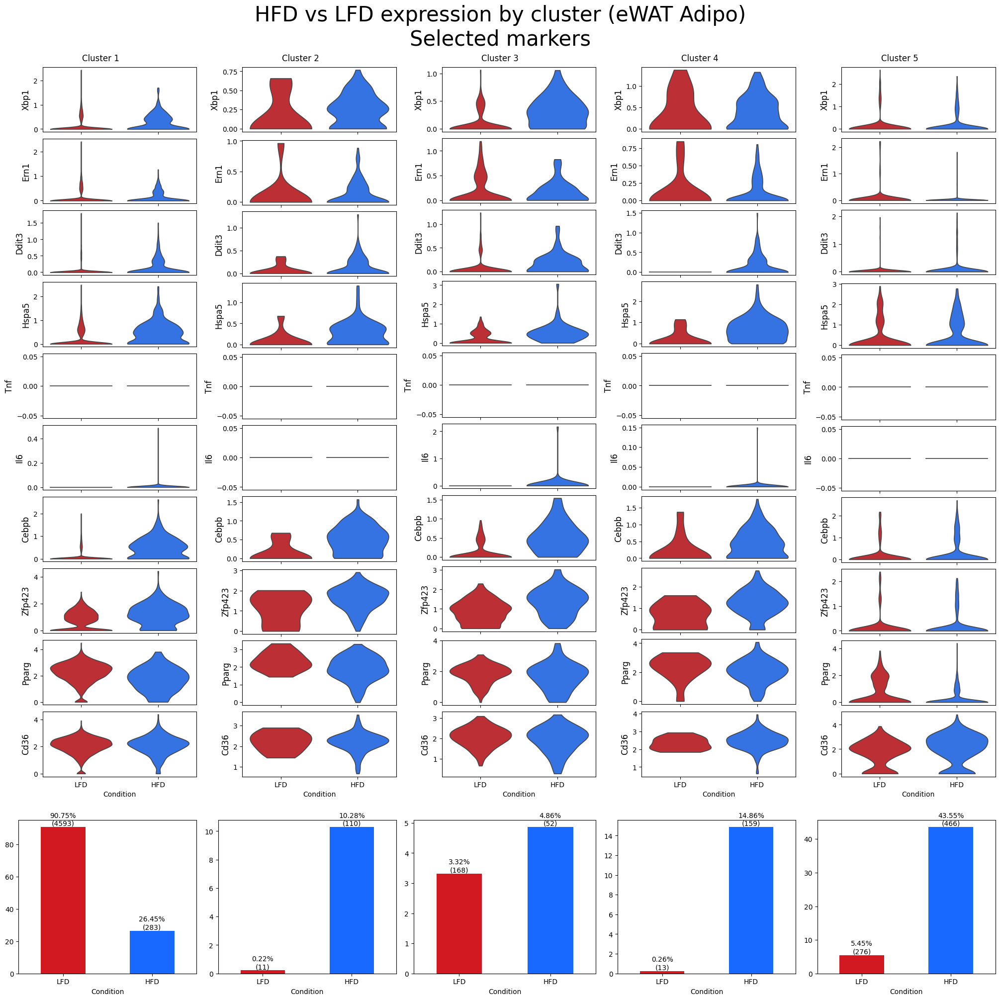

In [196]:
# eWAT FBs
pop_name = "eWAT Adipo"
key = "leiden_adipo_group"

ewat_adipo = ewat_adipo[ewat_adipo.obs[key] != "6"]

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(ewat_adipo, "Condition", key, all_adipo_markers, f)
f.suptitle(
    f"HFD vs LFD expression by cluster ({pop_name})\nSelected markers", fontsize=30
)

# f = plt.figure(figsize=(20,20),layout="constrained")
# plot_cluster_violinplot(ewat_fibros,"Condition","leiden_fibro_group", tgfb_genes, f)
# f.suptitle(f"HFD vs LFD expression by cluster ({pop_name})\nCurated TGFβ-responsive genes", fontsize=30)

# f = plt.figure(figsize=(20,20),layout="constrained")
# plot_cluster_violinplot(ewat_fibros,"Condition","leiden_fibro_group", ifn_genes, f)
# f.suptitle(f"HFD vs LFD expression by cluster ({pop_name})\nCurated IFN-responsive genes", fontsize=30)

# axs = sc.pl.embedding(ewat_fibros, basis="LocalMAP_fibro", layer='normalized', color=all_fibro_markers+["leiden_fibro", "leiden_fibro_group", "Condition"],
#                       ncols=5, alpha=0.7, show=False, color_map=DEFAULT_CMAP)
# f = axs[0].get_figure()
# f.suptitle('Feature plots for all markers (All FBs)', fontsize=30)

# Subcluster Decision

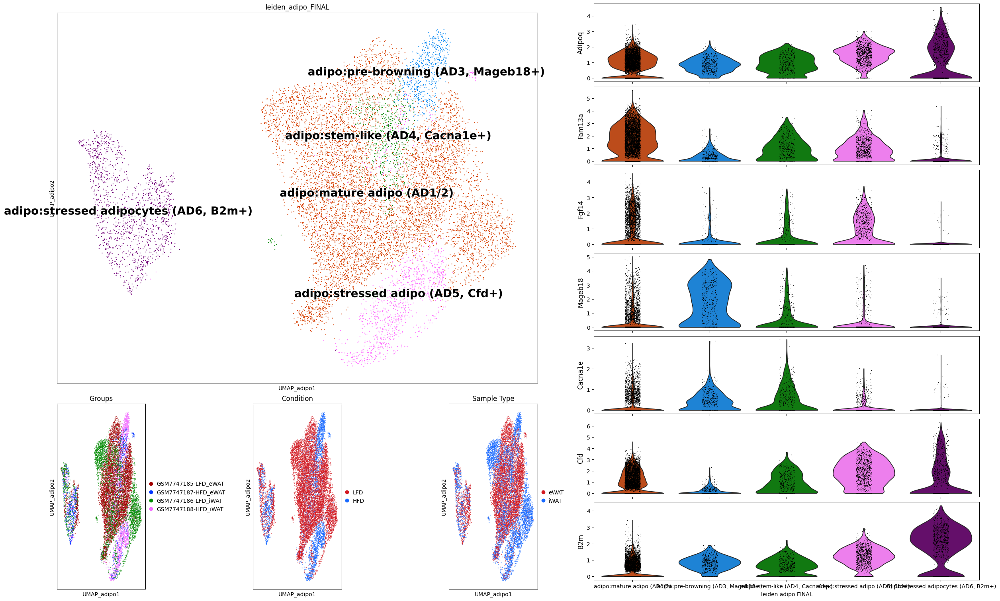

In [ ]:
# figure prep
old_cluster_key = "leiden_adipo_group"
cluster_key = "leiden_adipo_FINAL"
embedding = "UMAP_adipo"  # "UMAP_stromal"

adata_adipo.obs[cluster_key] = (
    adata_adipo.obs[old_cluster_key]
    .map(
        {
            "1": "adipo:mature adipo (AD1/2)",
            "6": "adipo:mature adipo (AD1/2)",
            "2": "adipo:pre-browning (AD3, Mageb18+)",
            "3": "adipo:stem-like (AD4, Cacna1e+)",
            "4": "adipo:stressed adipo (AD5, Cfd+)",
            "5": "adipo:stressed adipocytes (AD6, B2m+)",
        }
    )
    .astype(str)
)

# figure prep
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

axs = sf[0].subplots(3, 2)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=[cluster_key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=color_gen(adata_adipo.obs[cluster_key]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_adipo,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_adipo.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = ["Adipoq", "Fam13a", "Fgf14", "Mageb18", "Cacna1e", "Cfd", "B2m"]
plot_violinplot(adata_adipo, markers, cluster_key, sf[1])
plot_cluster_barplots(adata_adipo, "Condition", cluster_key, f)

dendrogram data not found (using key=dendrogram_leiden_adipo_FINAL). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.
Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: adipo:mature adipo (AD1/2), adipo:pre-browning (AD3, Mageb18+), adipo:stem-like (AD4, Cacna1e+), etc.
var_group_labels: B2m high - stressed adipocytes (AD6), Cfd high - stressed adipocytes (AD5), Mageb18, pre-browning? (AD3), etc.


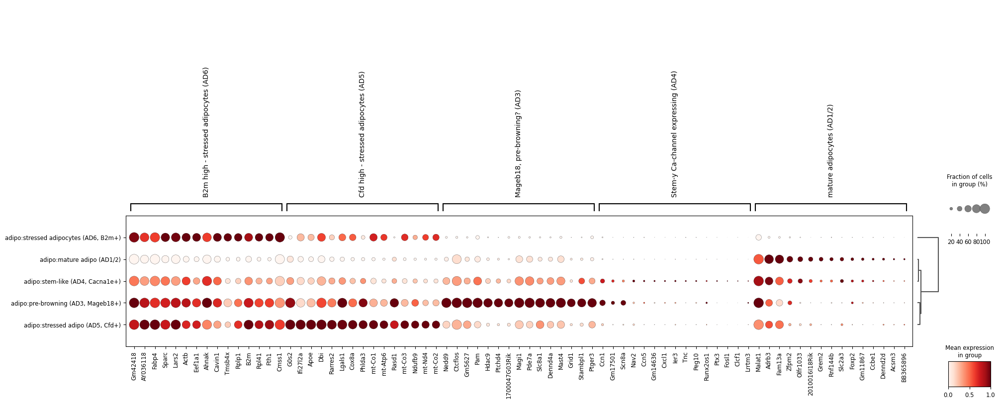

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: adipo:mature adipo (AD1/2), adipo:pre-browning (AD3, Mageb18+), adipo:stem-like (AD4, Cacna1e+), etc.
var_group_labels: B2m high - stressed adipocytes (AD6), Cfd high - stressed adipocytes (AD5), Mageb18, pre-browning? (AD3), etc.
Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


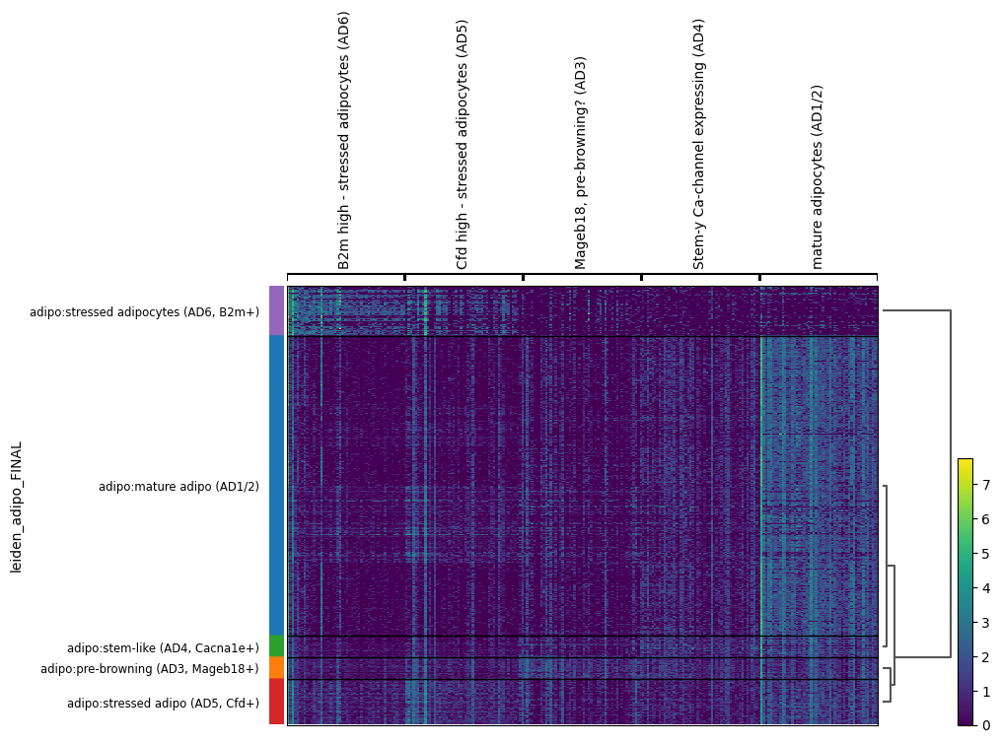

In [14]:
group_key = "leiden_adipo_FINAL"
de_key = "de_adipo_FINAL"
runDEGs = False

# clean metadata
clear_uns(adata_adipo, group_key)

if runDEGs is True:
    # run DEGs
    sc.tl.rank_genes_groups(
        adata_adipo,
        groupby=group_key,
        key_added=de_key,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(20, 8), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_adipo,
    groupby=group_key,
    key=de_key,
    standard_scale="var",
    n_genes=15,
    min_logfoldchange=2,
    ax=ax,
)

# plot DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_adipo, key=de_key, groupby=group_key, layer="normalized", n_genes=50
)

100%|██████████| 5/5 [08:26<00:00, 101.38s/it]


adipo:mature adipo (AD1/2)
adipo:pre-browning (AD3, Mageb18+)
adipo:stem-like (AD4, Cacna1e+)
adipo:stressed adipo (AD5, Cfd+)
adipo:stressed adipocytes (AD6, B2m+)


Text(0.5, 1.0, 'GSEA by Cluster vs Others (top 50 each)')

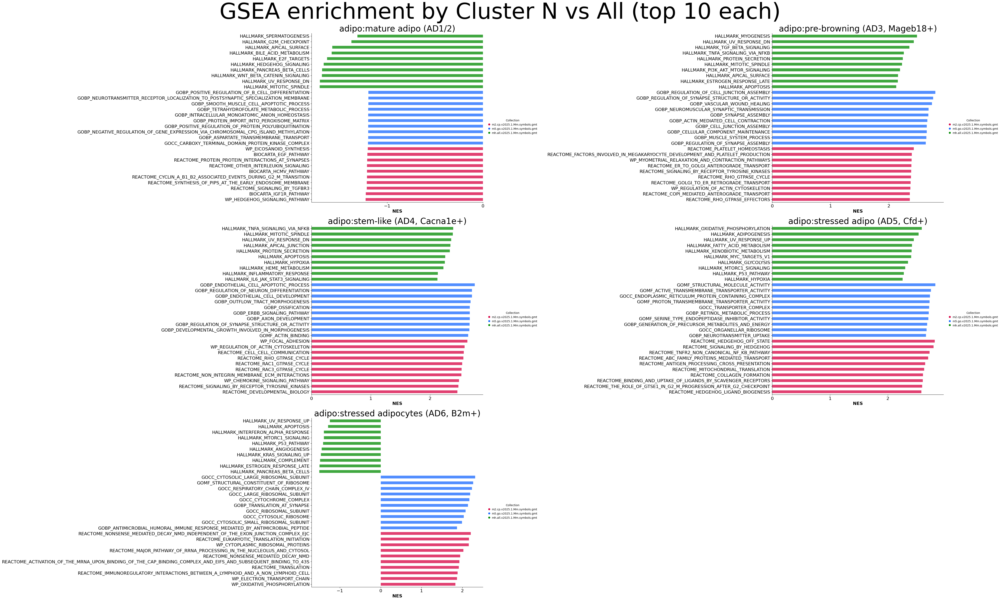

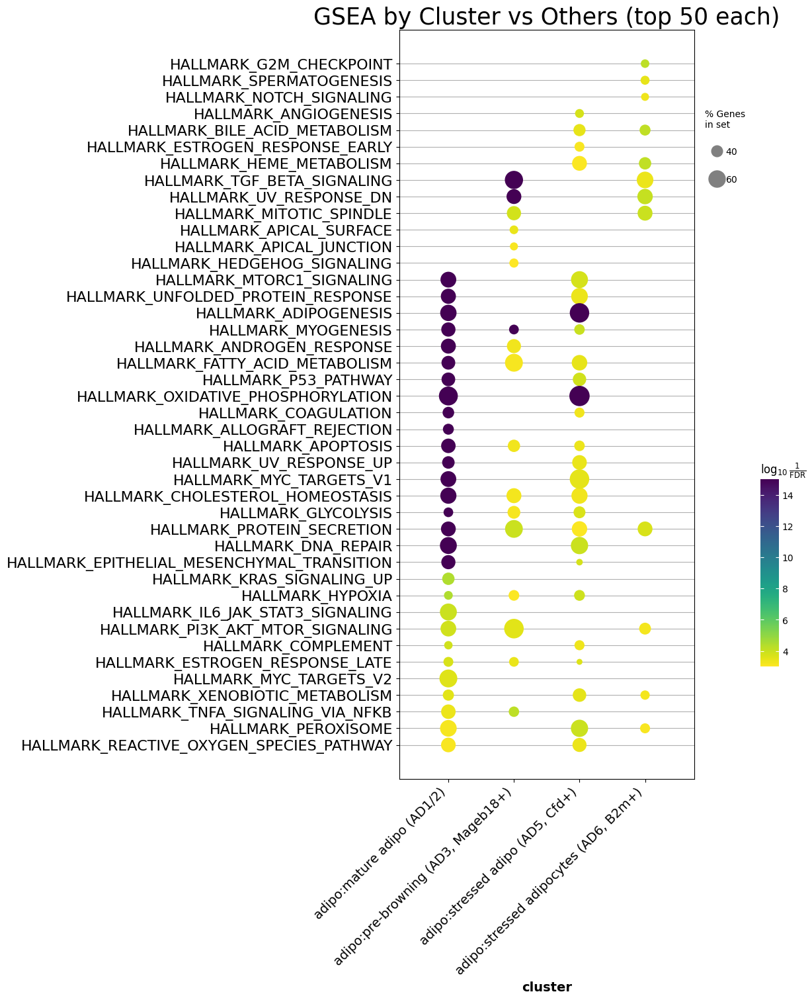

In [ ]:
# GSEApy approach, by cluster
runGSEA = False
method = "gsea"
comparison = "leiden_adipo_FINAL"
collection_query = "mh"
top_n = 50
ncol = 2
nrow = 3
assert ncol * nrow > len(adata_adipo.obs[comparison].cat.categories)

annotation = "manDoublet-seuratV3-harmony-annotated-adipo - GSEA by cluster"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = GSEA_gseapy(
        adata_adipo,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )
    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)


collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(nrow, ncol, figsize=(25 * ncol, 10 * nrow), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    gp.plot.barplot(
        cell_gsea_results[cluster][cell_gsea_results[cluster]["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(cluster, size=30)
f.suptitle(f"GSEA enrichment by Cluster N vs All (top 10 each)", size=80)
ax[-1].remove()

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])


results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(12, 15), layout="constrained")
gp.plot.dotplot(
    results_grouped,
    "FDR q-val",
    x="cluster",
    ax=ax,
    top_term=top_n,
    cutoff=1e-3,
)
plt.xticks(rotation=45, ha="right")
plt.title(f"GSEA by Cluster vs Others (top {top_n} each)", size=25)

100%|██████████| 2/2 [03:24<00:00, 102.38s/it]


ALL
adipo:mature adipo (AD1/2)
adipo:pre-browning (AD3, Mageb18+)
adipo:stem-like (AD4, Cacna1e+)
adipo:stressed adipo (AD5, Cfd+)
adipo:stressed adipocytes (AD6, B2m+)


Text(0.5, 1.0, 'HFD GSEA by Cluster (top 50 each)')

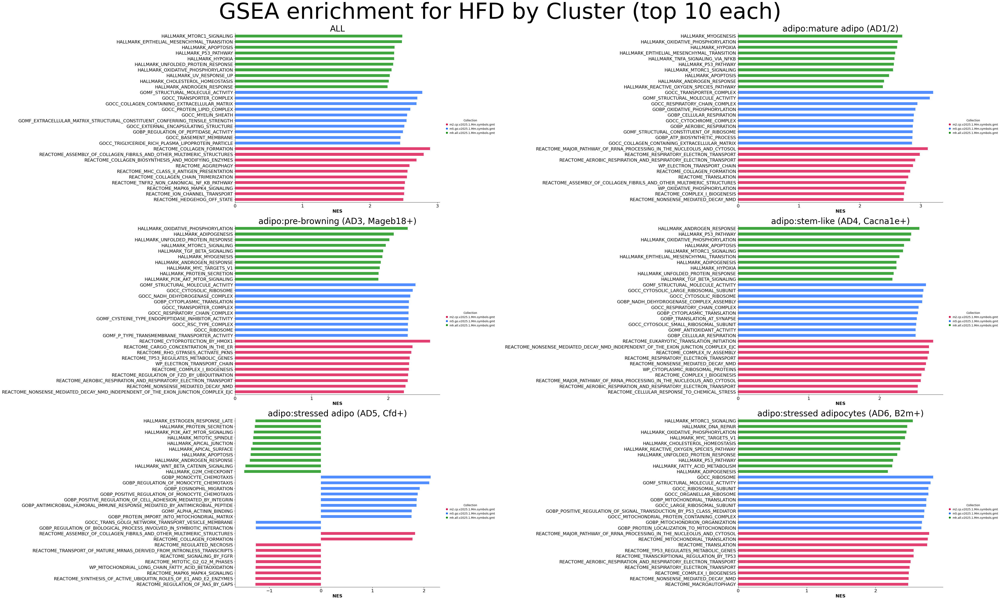

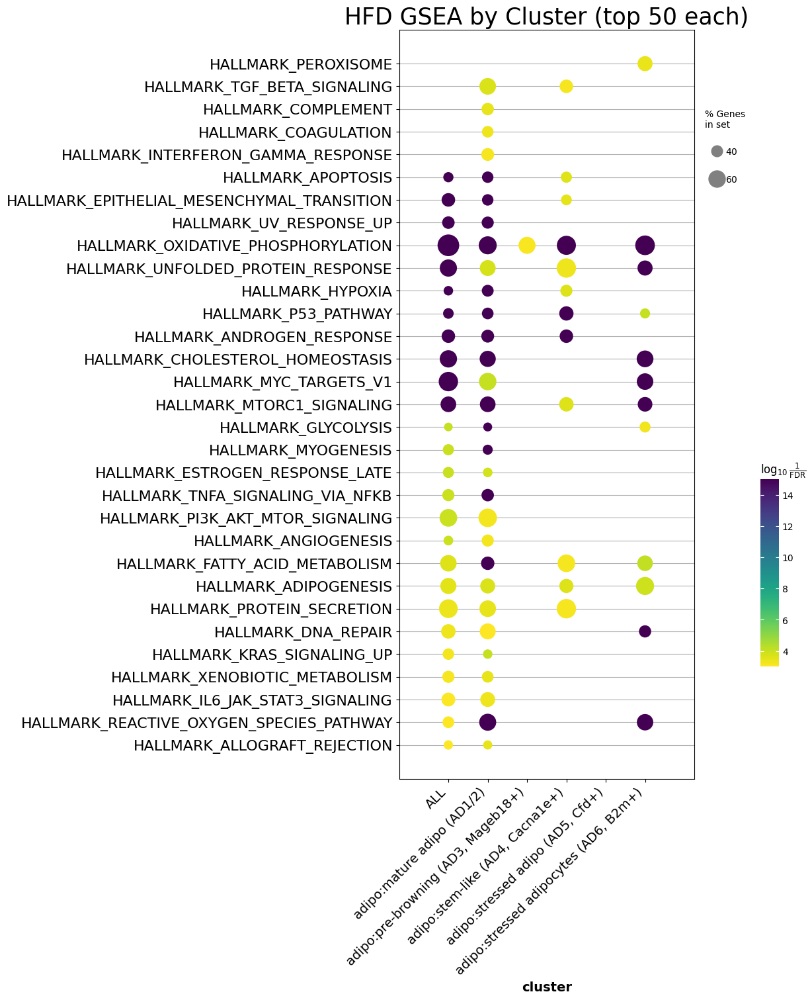

In [ ]:
# GSEApy approach, condition by cluster
runGSEA = True
method = "gsea"
cluster_key = "leiden_adipo_FINAL"
comparison = "Condition"
collection_query = "mh"
top_n = 50
ncol = 2
nrow = 3
assert ncol * nrow >= len(adata_adipo.obs[comparison].cat.categories)

annotation = (
    "manDoublet-seuratV3-harmony-annotated-adipo - GSEA for condition by cluster"
)
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MACRO_MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = {}
    for cluster in adata_adipo.obs[cluster_key].unique():
        tmp = adata_adipo[adata_adipo.obs[cluster_key] == cluster]
        cell_gsea_results[cluster] = GSEA_gseapy(
            tmp,
            genesets=[dataset for dataset in gsea_sets.values()],
            method=method,
            groupby=comparison,
            permutation_num=500,
        )

    cell_gsea_results["ALL"] = GSEA_gseapy(
        adata_adipo,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )

    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)

collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(nrow, ncol, figsize=(25 * ncol, 10 * nrow), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    gp.plot.barplot(
        tmp[tmp["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(cluster, size=30)
f.suptitle(f"GSEA enrichment for HFD by Cluster (top 10 each)", size=80)

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(12, 15), layout="constrained")
gp.plot.dotplot(
    results_grouped,
    "FDR q-val",
    x="cluster",
    ax=ax,
    top_term=top_n,
    cutoff=1e-3,
    x_order=["ALL"]
    + adata_adipo.obs[cluster_key].cat.categories.sort_values().to_list(),
)
plt.xticks(rotation=45, ha="right")
plt.title(f"HFD GSEA by Cluster (top {top_n} each)", size=25)

# Save/Load

In [12]:
# save
annotation = "manDoublet-seuratV3-harmony-annotated-adipo"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")
os.makedirs(savedir, exist_ok=True)
adata_adipo.write(os.path.join(savedir, f"{annotation}.h5ad"))

In [5]:
# load
annotation = "manDoublet-seuratV3-harmony-annotated-adipo"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")
adata_adipo = sc.read_h5ad(os.path.join(savedir, f"{annotation}.h5ad"))

# relevant subsets
# ewat_adipo = adata_adipo[adata_adipo.obs["Sample Type"] == "eWAT"].copy()
# lfd_ewat_adipo = ewat_adipo[ewat_adipo.obs["Condition"] == "LFD"].copy()
# hfd_ewat_adipo = ewat_adipo[ewat_adipo.obs["Condition"] == "HFD"].copy()